# Neural Network Midterm - spring 2024

## Mohammad Hossein Najafi - 97103938
---
We analyze the Hopfield network for memory association, and also work with the Self-Organizing Map (SOM) network in image segmentation.

### PART 1 - Hopfield Network Implementation

#### Prerequisites
First, we import the numpy library as it is used for working with arrays. We also import the matplotlib library for displaying images, and the HTML library for animation purposes.

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from PIL import Image

#### Patterns
We define three different patterns in a list of 225 elements, which can be displayed as a 15x15 2D representation.

In [2]:
Batman=[1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,1,1,1,1,-1,1,-1,-1,-1,-1,-1,1,1,-1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,-1,1,-1,-1,-1,-1,-1,1,1,-1,1,1,1,1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1];
a = [-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,1,1,-1,-1,1,1,1,1,1,1,1,1,1,1,1,1,1,-1,-1,1,1,1,1,-1,-1,1,1,1,-1,-1,-1,-1,-1,-1,1,1,1,1,-1,-1,1,1,1,-1,-1,-1,-1,-1,-1,1,1,1,1,-1,-1,1,1,1,-1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,1,1,1,1,1,1,1,1,1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1];
z = [-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,1,-1,-1,-1,-1,-1,1,1,1,-1,-1,-1,-1,1,1,1,-1,-1,-1,-1,1,1,1,1,-1,-1,-1,-1,1,1,1,-1,-1,-1,1,1,1,1,1,-1,-1,-1,-1,1,1,1,-1,-1,1,1,1,1,1,1,-1,-1,-1,-1,1,1,1,-1,1,1,1,1,1,1,1,-1,-1,-1,-1,1,1,1,1,1,1,1,-1,1,1,1,-1,-1,-1,-1,1,1,1,1,1,1,-1,-1,1,1,1,-1,-1,-1,-1,1,1,1,1,1,-1,-1,-1,1,1,1,-1,-1,-1,-1,1,1,1,1,-1,-1,-1,-1,1,1,1,-1,-1,-1,-1,1,1,1,-1,-1,-1,-1,-1,1,1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1]
patt=np.array([Batman,a,z])       # Define the patterns to be stored in the network

#### Display the patterns
Now, we display these patterns in a 15x15 2D representation.

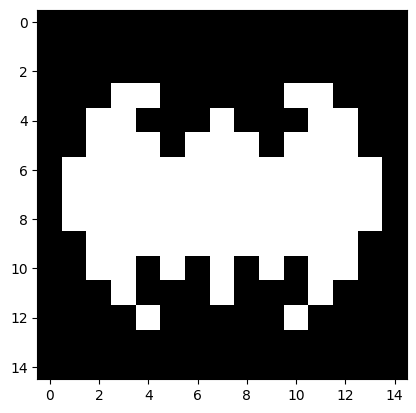

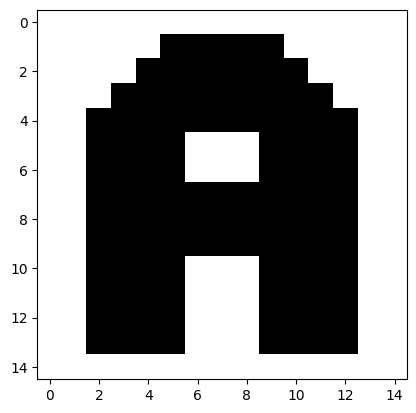

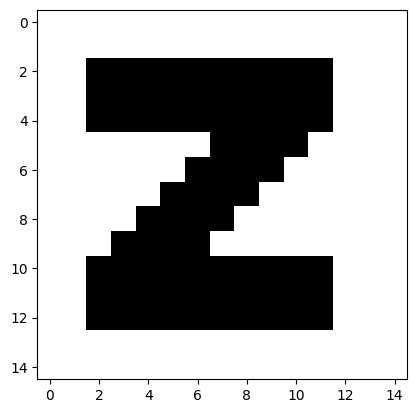

In [3]:
plt.imshow(np.array(patt[0]).reshape(15,15).T,cmap='binary')
plt.show()
plt.imshow(np.array(patt[1]).reshape(15,15).T,cmap='binary')
plt.show()
plt.imshow(np.array(patt[2]).reshape(15,15).T,cmap='binary')
plt.show()

#### Hopfield Network
So, we define a model based on the Hopfield network to learn these patterns.

In [4]:
class Hopfield_Network:
    def __init__(self, num_neurons):  # Initialize the network
        self.num_neurons = num_neurons
        self.weights = np.zeros((num_neurons, num_neurons))

    def train(self, patterns):  # Train the network
        for pattern in patterns:  # Calculate the outer product of the pattern with itself and add it to the weights
            pattern = np.array(pattern)
            self.weights += np.outer(pattern, pattern)
            np.fill_diagonal(self.weights, 0)  # Set the diagonal to 0

    def predict(self, pattern):  # Predict the output of the network
        pattern = np.array(pattern)
        output = np.copy(pattern)
        change_steps = []
        change_steps.append(np.copy(output))  # Append initial state

        neuron_index = np.arange(self.num_neurons)
        np.random.shuffle(neuron_index)  # Shuffle the neuron indices

        for i in neuron_index:
            original_state = output[i]
            y_in = output[i] + np.dot(self.weights[i], output)  # Calculate the input to the neuron

            if y_in > 0:
                output[i] = 1
            elif y_in < 0:
                output[i] = -1

            # Check if there's a change and append the new state
            if output[i] != original_state:
                change_steps.append(np.copy(output))

        return output, change_steps



#### Training
Now, we initialize the model with 225 neurons and trian the model with the patterns. For validation, we feed the same patterns back to the model and generate predictions.

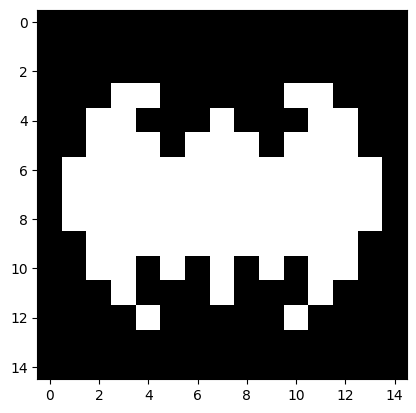

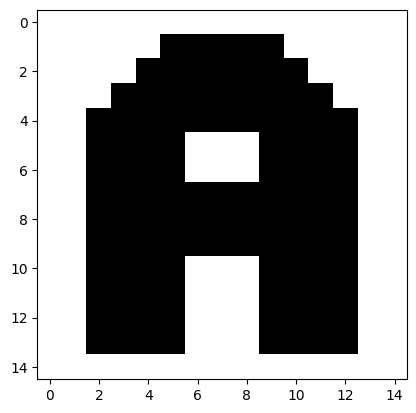

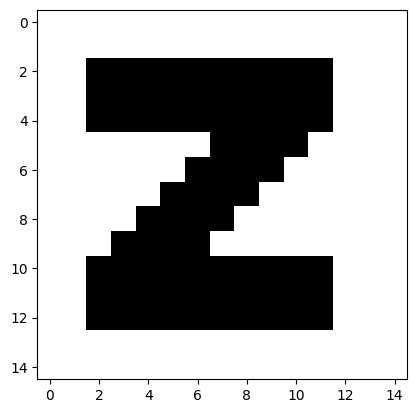

In [5]:
model = Hopfield_Network(225) # Create a Hopfield Network with 225 neurons

model.train(patt) # Train the network with the patterns

(output,m) = model.predict(patt[0]) # Predict the output of the network given the Batman pattern
plt.imshow(np.array(output).reshape(15,15).T,cmap='binary') # Display the output
plt.show()

(output,n) = model.predict(patt[1]) # Predict the output of the network given the a pattern
plt.imshow(np.array(output).reshape(15,15).T,cmap='binary') # Display the output
plt.show()

(output,p) = model.predict(patt[2]) # Predict the output of the network given the z pattern
plt.imshow(np.array(output).reshape(15,15).T,cmap='binary') # Display the output
plt.show()

As we can see it, predicts the patterns correctly.

In [6]:
def corrupt_image(img,percentage):      # Function to corrupt the image

    corrupt_img = np.copy(img)
    num_corruptions = int((percentage/100)*len(img))
    indices = np.random.choice(len(img),num_corruptions,replace=False)
    for i in indices:
        corrupt_img[i] = corrupt_img[i]*-1

    return corrupt_img

In [7]:
z_corrupt_img_10 = corrupt_image(z,10)
z_corrupt_img_25 = corrupt_image(z,25)
z_corrupt_img_50 = corrupt_image(z,50)
z_corrupt_img_75 = corrupt_image(z,75)

a_corrupt_img_10 = corrupt_image(a,10)
a_corrupt_img_25 = corrupt_image(a,25)
a_corrupt_img_50 = corrupt_image(a,50)
a_corrupt_img_75 = corrupt_image(a,75)

Batman_corrupt_img_10 = corrupt_image(Batman,10)
Batman_corrupt_img_25 = corrupt_image(Batman,25)
Batman_corrupt_img_50 = corrupt_image(Batman,50)
Batman_corrupt_img_75 = corrupt_image(Batman,75)

#### Display Corrupted Images

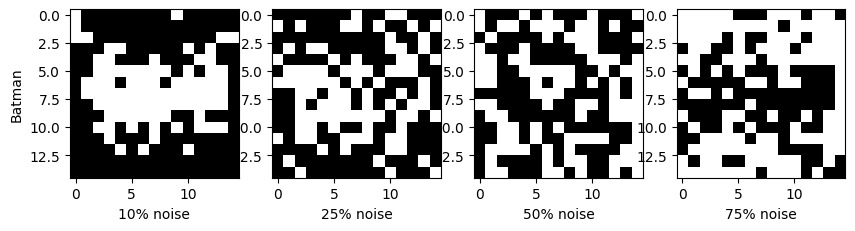

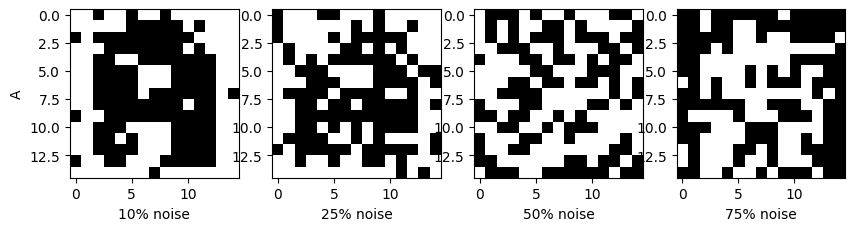

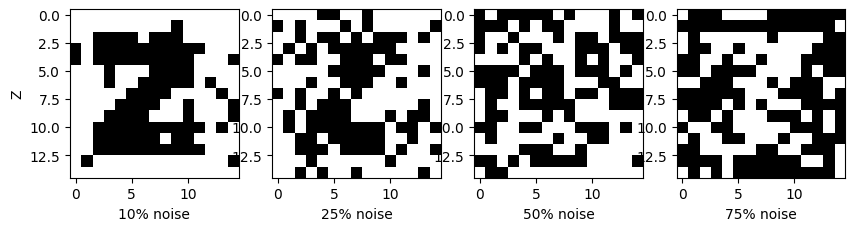

In [8]:
# Define the corrupted images
corrupted_images = [Batman_corrupt_img_10,Batman_corrupt_img_25,Batman_corrupt_img_50,Batman_corrupt_img_75,a_corrupt_img_10,a_corrupt_img_25,a_corrupt_img_50,a_corrupt_img_75,z_corrupt_img_10,z_corrupt_img_25,z_corrupt_img_50,z_corrupt_img_75]
names =('Batman','A','Z')

for i in range(0,len(corrupted_images),4): # Display the corrupted images
    plt.figure(figsize=(10,10))

    plt.subplot(1,4,1)
    plt.imshow(np.array(corrupted_images[i]).reshape(15,15).T,cmap='binary')
    plt.xlabel('10% noise')
    plt.ylabel(names[int(i/4)])

    plt.subplot(1,4,2)
    plt.imshow(np.array(corrupted_images[i+1]).reshape(15,15).T,cmap='binary')
    plt.xlabel('25% noise')

    plt.subplot(1,4,3)
    plt.imshow(np.array(corrupted_images[i+2]).reshape(15,15).T,cmap='binary')
    plt.xlabel("50% noise")

    plt.subplot(1,4,4)
    plt.imshow(np.array(corrupted_images[i+3]).reshape(15,15).T,cmap='binary')
    plt.xlabel("75% noise")
    plt.show()


#### Restoring
Now, for each noise-corrupted pattern, we feed it into the Hopfield network. The network will converge to one of the original patterns (or maybe other things), effectively restoring it.

In [9]:
pattern_predicts = [0] * len(corrupted_images)

for i in range(12):
  (not_used,pattern_predicts[i]) = model.predict(corrupted_images[i])

len(pattern_predicts[0])

23

#### Animating Resotring Noisy Patterns

##### Batmna 10% Noise

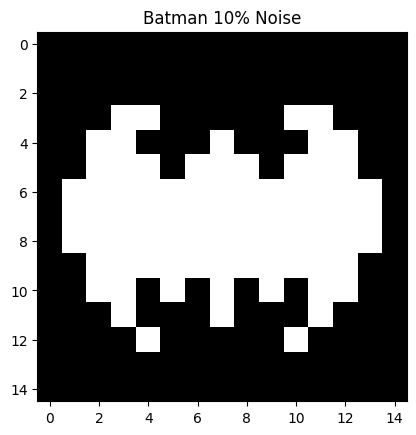

In [10]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("Batman 10% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[0][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[0]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### Batman 25% Noise

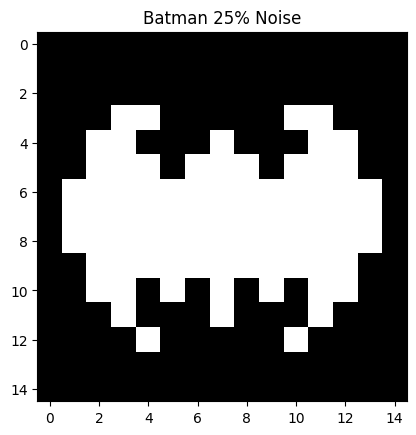

In [11]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("Batman 25% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[1][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[1]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### Batman 50% Noise

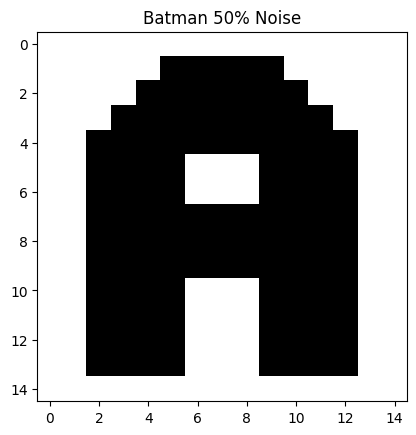

In [12]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("Batman 50% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[2][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[2]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### Batman 75% Noise

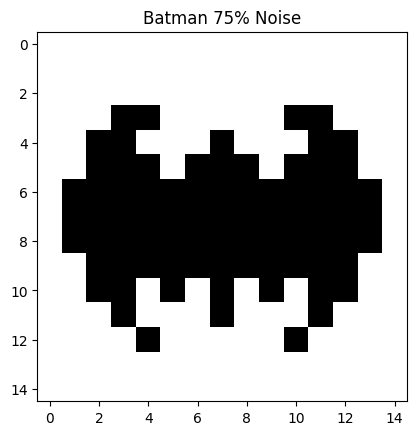

In [13]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("Batman 75% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[3][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[3]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### A 10% noise

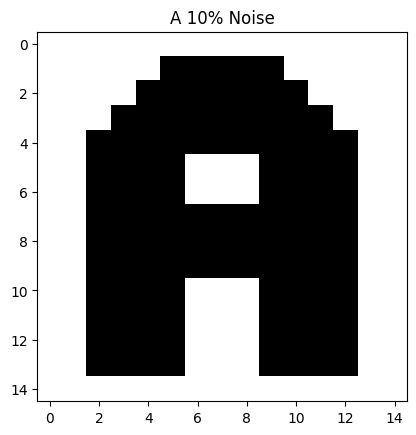

In [14]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("A 10% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[4][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[4]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### A 25% noise

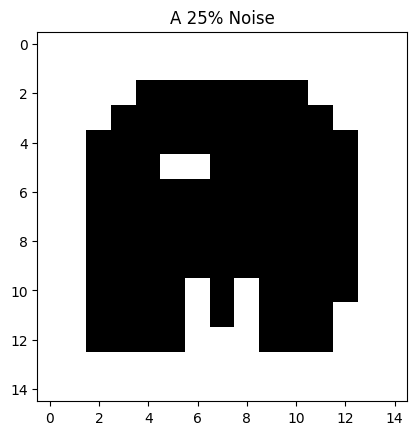

In [15]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("A 25% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[5][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[5]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### A 50% noise

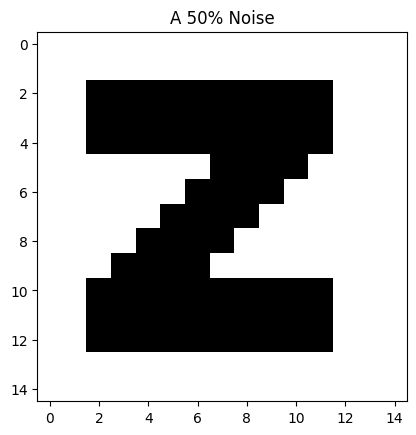

In [16]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("A 50% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[6][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[6]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())

##### A 75% noisy


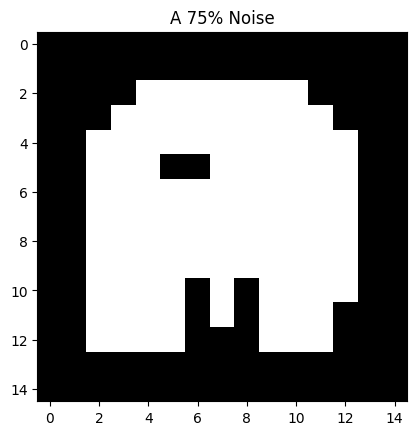

In [17]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("A 75% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[7][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[7]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### Z 10% noisy

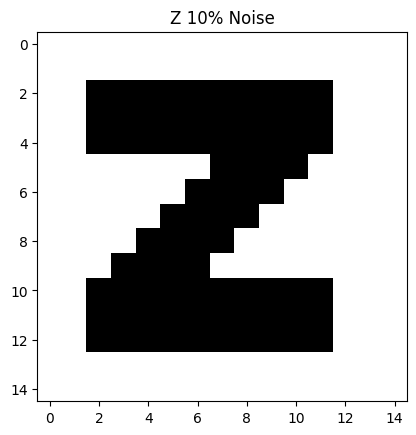

In [18]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("Z 10% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[8][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[8]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### Z 25% noisy

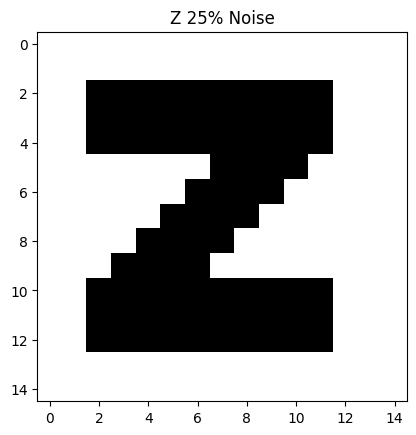

In [19]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("Z 25% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[9][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[9]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### Z 50% noisy

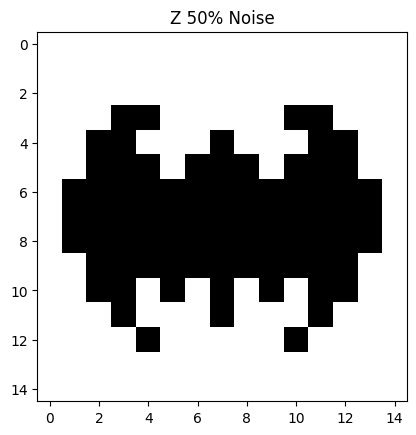

In [20]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("Z 50% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[10][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[10]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


##### Z 75% noisy

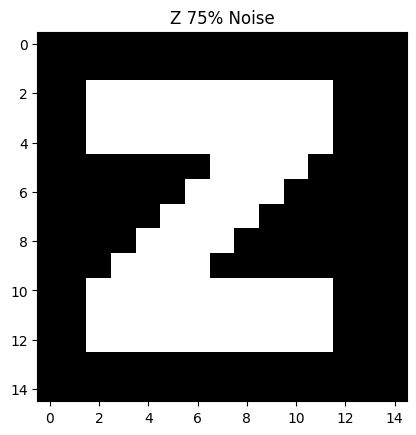

In [21]:
# Create a figure and axis
fig, ax = plt.subplots()

# Initialize an empty plot
im = ax.imshow(np.zeros((15, 15)), cmap='binary', vmin=-1, vmax=1)
plt.title("Z 75% Noise")
# Update function for animation
def update(frame):
    im.set_array(pattern_predicts[11][frame].reshape(15, 15).T)
    return [im,]  # Return a list containing the updated artists

# Create the animation
ani = FuncAnimation(fig, update, frames=len(pattern_predicts[11]), blit=True)

# Generate HTML output for the animation
HTML(ani.to_jshtml())


#### Energy
The energy function in Hopfield networks is defined as follows:

$$
E = -\frac{1}{2} \sum_{i=1}^{N} \sum_{j=1}^{N} w_{ij} s_i s_j + \sum_{i=1}^{N} \theta_i s_i
$$

and theta is threshold of each neuron and we suppose it 0 so, we don't use second part of this formula to calculate Energy



In [22]:
def energy_hopfield(array):
  E = [0] * len(array)
  for i in range(len(array)):
    E[i] = -0.5 * np.dot(array[i].T , np.dot(model.weights,array[i]))
  return E

Energy = [0] * 12

for j in range(12):
  Energy[j] = energy_hopfield(pattern_predicts[j])

#### Sketch
Sketching energy versus step for each noisy pattern until restoration.

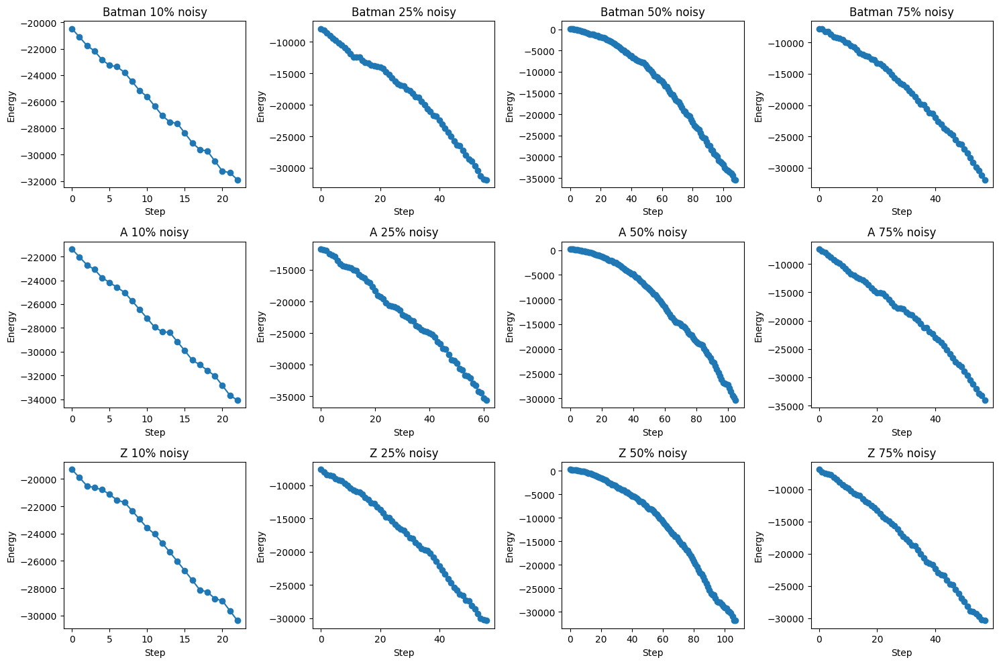

In [ ]:
# Create a 3x4 grid of subplots, adjust figsize as needed
fig, axes = plt.subplots(3, 4, figsize=(15, 10))
fig_names=["Batman 10% noisy","Batman 25% noisy","Batman 50% noisy","Batman 75% noisy",
           "A 10% noisy", "A 25% noisy", "A 50% noisy", "A 75% noisy",
           "Z 10% noisy", "Z 25% noisy", "Z 50% noisy", "Z 75% noisy",]

for i, ax in enumerate(axes.flat):
    if i < len(Energy):
        ax.plot(Energy[i], marker='o')
        ax.set_title(f'{fig_names[i]}')
        ax.set_xlabel('Step')
        ax.set_ylabel('Energy')
    else:
        ax.set_visible(False)

plt.tight_layout()
plt.show()

## Part 2 - SOM Networks

#### Defintion SOM Network
Firstly, we define a class for the SOM network that include the required functions

In [ ]:
class SOM_network:      # Self Organizing Map class
    def __init__(self, num_neurons):        # Initialize the network
        self.num_neurons = num_neurons
        self.weights = np.random.uniform(0,1,(self.num_neurons, self.num_neurons, 3))  # 3 for RGB channels
        self.learning_rate = 2
        self.sigma = 50
        self.constat_time = 1

    def find_bmu(self,inp):   # Finding best match unit
        distances = np.linalg.norm(self.weights - inp, axis=2)
        self.bmu = np.unravel_index(np.argmin(distances), distances.shape)
    def update_som(self,inp,epoch):   # Update som cells
        for i in range(self.weights.shape[0]):
            for j in range(self.weights.shape[1]):
                cell=(i,j)
                factor = self.calc_factor(np.linalg.norm(np.subtract(cell,self.bmu)),epoch)
                self.weights[cell] += self.learning_rate*factor*(inp-self.weights[cell])


    def update_cell(self,epoch,inp):   # Update cell weights
        self.weights[self.bmu] += self.learning_rate*(inp-self.weights[self.bmu])

    def update_lr(self,epoch):   # Update learning rate
        self.learning_rate *= np.power(0.5,epoch)

    def calc_factor(self,bmu_dist,epoch):  # Calculating neighboring factor
        return np.exp(-(bmu_dist**2)/(2*self.radius(epoch)**2))


    def radius(self,epoch):     # Calculating neighboring radius
        return self.sigma * np.exp(-epoch/self.constat_time)

    def train(self,inputs,epochs):      # Training the network with input data
        self.weights = self.weights   # Randomly initialize the weights with values between 0 and 1 in the __init__ function
        self.epochs = epochs

        for epoch in range(epochs):
            for input_vector in inputs:
                self.find_bmu(input_vector)
                self.update_cell(input_vector,epoch)
                self.update_som(input_vector,epoch)

            self.update_lr(epoch)


#### Generate the inputs
Now, we generate 5 vectors with 3 dimensions, where each element is a random number between 0 and 1.

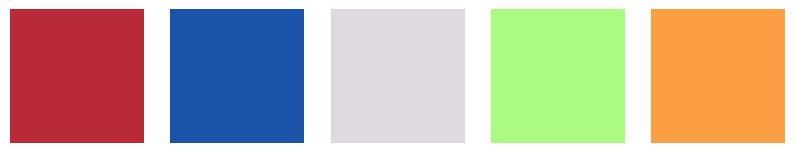

In [ ]:
# Generate random input vectors
input_vectors = np.random.rand(5,3)

# Plot the RGB colors
plt.figure(figsize=(10, 2))
for i, ax in enumerate(axes.flat):
for i, vector in enumerate(input_vectors):
    plt.subplot(1, 5, i + 1)
    plt.imshow([[vector]])
    plt.axis('off')
plt.show()

#### Define Model
Now, we define model based on SOM network, then show the initial colors.

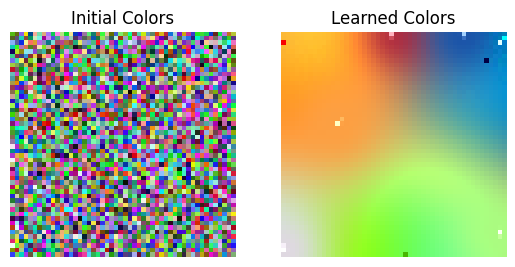

In [ ]:
som_model = SOM_network(50) # Create a SOM network with 50 neurons
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
plt.imshow(som_model.weights)
plt.title('Initial Colors')
plt.axis('off')


som_model.train(input_vectors, 100) # Train the SOM network
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
plt.imshow(som_model.weights)
plt.title('Learned Colors')
plt.axis('off')

plt.show()

## Picture

In [52]:
class ColorClusteringSOM:
    def __init__(self):
        # Initialize the cluster weights with specific colors and ensure they are floats
        self.cluster_weights = np.array([
            [165, 42, 42],   # Brown
            [0, 0, 255],     # Blue
            [0, 128, 0],     # Green
            [255, 224, 189]  # Skin color
        ]).T.astype(float)  # Convert to float to handle floating-point operations during training

    def calculate_distances(self, color):
        return np.array([np.linalg.norm(color - self.cluster_weights[:, idx]) for idx in range(self.cluster_weights.shape[1])])

    def randomize_indices(self, length):
        indices = list(range(length))
        random.shuffle(indices)
        return indices

    def update_weights(self, color, idx, lr):
        # Update the weights using floating point operations
        adjustment = lr * (color - self.cluster_weights[:, idx])
        self.cluster_weights[:, idx] += adjustment

    def fit(self, colors, epochs, lr):
        for epoch in range(epochs):
            current_lr = lr / (1 + 100 * (epoch + 1) / epochs)
            for i in self.randomize_indices(colors.shape[0]):
                color = colors[i]
                distances = self.calculate_distances(color)
                bmu = np.argmin(distances)
                self.update_weights(color, bmu, current_lr)

    def assign_clusters(self, colors):
        cluster_assignments = np.array([np.argmin(self.calculate_distances(color)) for color in colors])
        clustered_colors = np.array([self.cluster_weights[:, idx] for idx in cluster_assignments])
        return clustered_colors, cluster_assignments

    def pixel_distribution(self, clusters):
        return np.array([np.sum(clusters == i) for i in range(self.cluster_weights.shape[1])])

In [53]:
# Image processing and SOM application
image_path = '/content/images.png'
image = Image.open(image_path).convert('RGB')
data = np.array(image)
pixels = data.reshape(-1, 3)

color_som = ColorClusteringSOM()

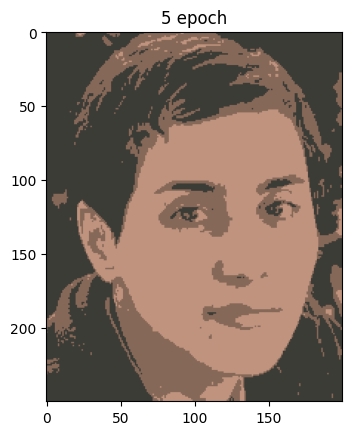

In [58]:
color_som.fit(pixels, epochs=5, lr=0.6)
new_colors, assignments = color_som.assign_clusters(pixels)

# Visualization of the results
plt.figure()
plt.title("5 epoch")
clustered_image = new_colors.reshape(data.shape[0], data.shape[1], 3) / 255
plt.imshow(clustered_image)
plt.show()

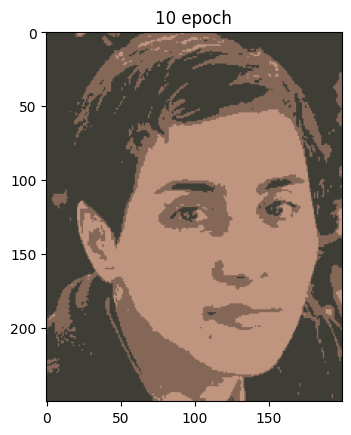

In [55]:
color_som.fit(pixels, epochs=10, lr=0.6)
new_colors, assignments = color_som.assign_clusters(pixels)

# Visualization of the results
plt.figure()
plt.title("10 epoch")
clustered_image = new_colors.reshape(data.shape[0], data.shape[1], 3) / 255
plt.imshow(clustered_image)
plt.show()

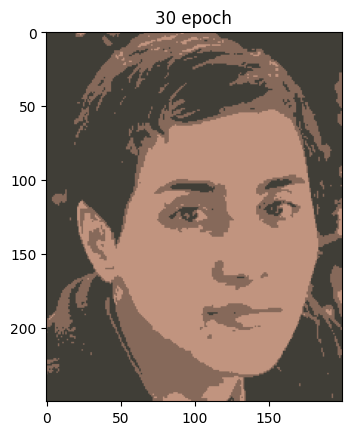

In [56]:
color_som.fit(pixels, epochs=30, lr=0.6)
new_colors, assignments = color_som.assign_clusters(pixels)

# Visualization of the results
plt.figure()
plt.title("30 epoch")
clustered_image = new_colors.reshape(data.shape[0], data.shape[1], 3) / 255
plt.imshow(clustered_image)
plt.show()

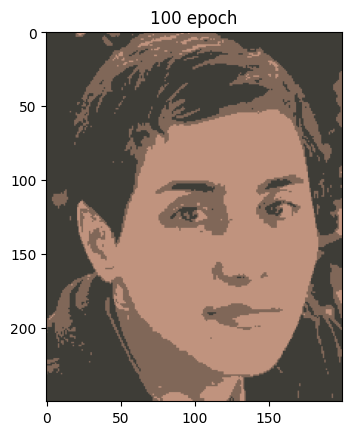

In [57]:
color_som.fit(pixels, epochs=100, lr=0.6)
new_colors, assignments = color_som.assign_clusters(pixels)

# Visualization of the results
plt.figure()
plt.title("100 epoch")
clustered_image = new_colors.reshape(data.shape[0], data.shape[1], 3) / 255
plt.imshow(clustered_image)
plt.show()